### Monday, May 15th, 2023

As usual we'll start by loading the trained model.

In [1]:
import os, sys

In [2]:
sys.path = [
    '', 
    '/home/callistb/miniconda3/envs/gdn/lib/python38.zip', 
    '/home/callistb/miniconda3/envs/gdn/lib/python3.8', 
    '/home/callistb/miniconda3/envs/gdn/lib/python3.8/lib-dynload', 
    '/home/callistb/miniconda3/envs/gdn/lib/python3.8/site-packages'
]

In [3]:
os.chdir('/home/callistb/GDN')

In [4]:
from main import *

In [5]:
random_seed = 5

random.seed(random_seed)
np.random.seed(random_seed)
torch.manual_seed(random_seed)
torch.cuda.manual_seed(random_seed)
torch.cuda.manual_seed_all(random_seed)
torch.backends.cudnn.benchmark = False
torch.backends.cudnn.deterministic = True
os.environ['PYTHONHASHSEED'] = str(random_seed)


train_config = {
    'batch': 32,
    'epoch': 50,
    'slide_win': 5,
    'dim': 128,
    'slide_stride': 1,
    'comment': '',
    'seed': random_seed,
    'out_layer_num': 1,
    'out_layer_inter_dim': 128,
    'decay': 0,
    'val_ratio': 0.2,
    'topk': 30,
}

env_config={
    'save_path': 'wadi',
    'dataset': 'wadi',
    'report': 'val',
    'device': 'cuda',
    'load_model_path': 'pretrained/wadi/best_05|04-15:46:47.pt'
}


main = Main(train_config, env_config, debug=False)
main.run()

=========================** Result **============================

F1 score: 0.40275650842266464
precision: 0.8885135135135135
recall: 0.2603960396039604



Now we'll visualize the trained graph.

In [6]:
import networkx as nx
from torch_geometric.utils import to_networkx, remove_self_loops
from torch_geometric.data import Data

In [7]:
weights = main.model.embedding.weight.detach().cpu()
norms = weights.norm(dim=1).unsqueeze(0)
cos_ji = torch.mm(weights, weights.T) / torch.mm(norms.T, norms)

In [8]:
adj = torch.topk(cos_ji, 30, dim=-1)[1]
adj

tensor([[  0,   3,  19,  ...,  52,  90,  85],
        [  1,  92,  82,  ...,  84,  91,  46],
        [  2,   3,  19,  ...,  58,  40,  53],
        ...,
        [124, 111,  35,  ..., 104,  51,  38],
        [125, 123,  11,  ...,   7,  63,  97],
        [126,  39,   4,  ...,  37,  31,  67]])

In [9]:
main.model.learned_graph

tensor([[  0,   3,  19,  ...,  52,  90,  85],
        [  1,  92,  82,  ...,  84,  91,  46],
        [  2,   3,  19,  ...,  58,  40,  53],
        ...,
        [124, 111,  35,  ..., 104,  51,  38],
        [125, 123,  11,  ...,   7,  63,  97],
        [126,  39,   4,  ...,  37,  31,  67]], device='cuda:0')

In [10]:
edge_index = torch.stack([
    torch.Tensor([i, j])
    for i, edge_list in enumerate(adj.cpu().numpy())
    for j in edge_list
]).T.long()

edge_index,_ = remove_self_loops(edge_index)

data = Data(
    x=torch.arange(len(adj)),
    edge_index=edge_index
)

G = to_networkx(data)

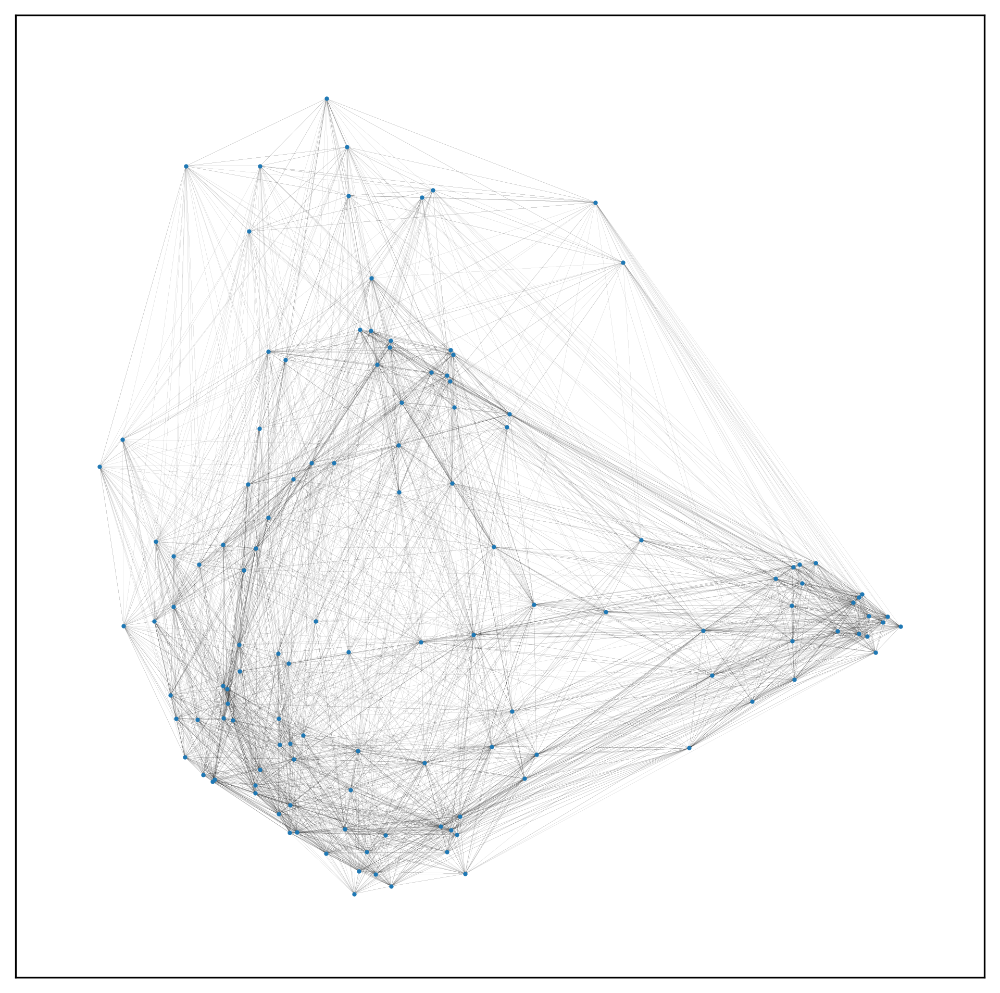

In [11]:
plt.figure(figsize=(8,8), dpi=300)
nx.draw_networkx(
    G,
    pos=nx.spectral_layout(G),
    with_labels=False,
    node_size=1,
    width=0.02,
    arrows=False,
)

Now we'll reset the embedding weights and visualize again.

In [12]:
main.model.init_params()

In [13]:
weights = main.model.embedding.weight.detach().cpu()
norms = weights.norm(dim=1).unsqueeze(0)
cos_ji = torch.mm(weights, weights.T) / torch.mm(norms.T, norms)

In [14]:
adj = torch.topk(cos_ji, 30, dim=-1)[1]
adj

tensor([[  0,   8,  24,  ...,  96,   7, 102],
        [  1,  33,  65,  ...,   9,  47,  59],
        [  2,  59,  77,  ...,  98,  62,  89],
        ...,
        [124, 107,  42,  ..., 126,  85,  27],
        [125,  80, 105,  ...,  18,  48,  77],
        [126,  25, 119,  ...,  31,  45, 100]])

In [15]:
main.model.learned_graph

tensor([[  0,   3,  19,  ...,  52,  90,  85],
        [  1,  92,  82,  ...,  84,  91,  46],
        [  2,   3,  19,  ...,  58,  40,  53],
        ...,
        [124, 111,  35,  ..., 104,  51,  38],
        [125, 123,  11,  ...,   7,  63,  97],
        [126,  39,   4,  ...,  37,  31,  67]], device='cuda:0')

In [16]:
edge_index = torch.stack([
    torch.Tensor([i, j])
    for i, edge_list in enumerate(adj.cpu().numpy())
    for j in edge_list
]).T.long()

edge_index,_ = remove_self_loops(edge_index)

data = Data(
    x=torch.arange(len(adj)),
    edge_index=edge_index
)

G = to_networkx(data)

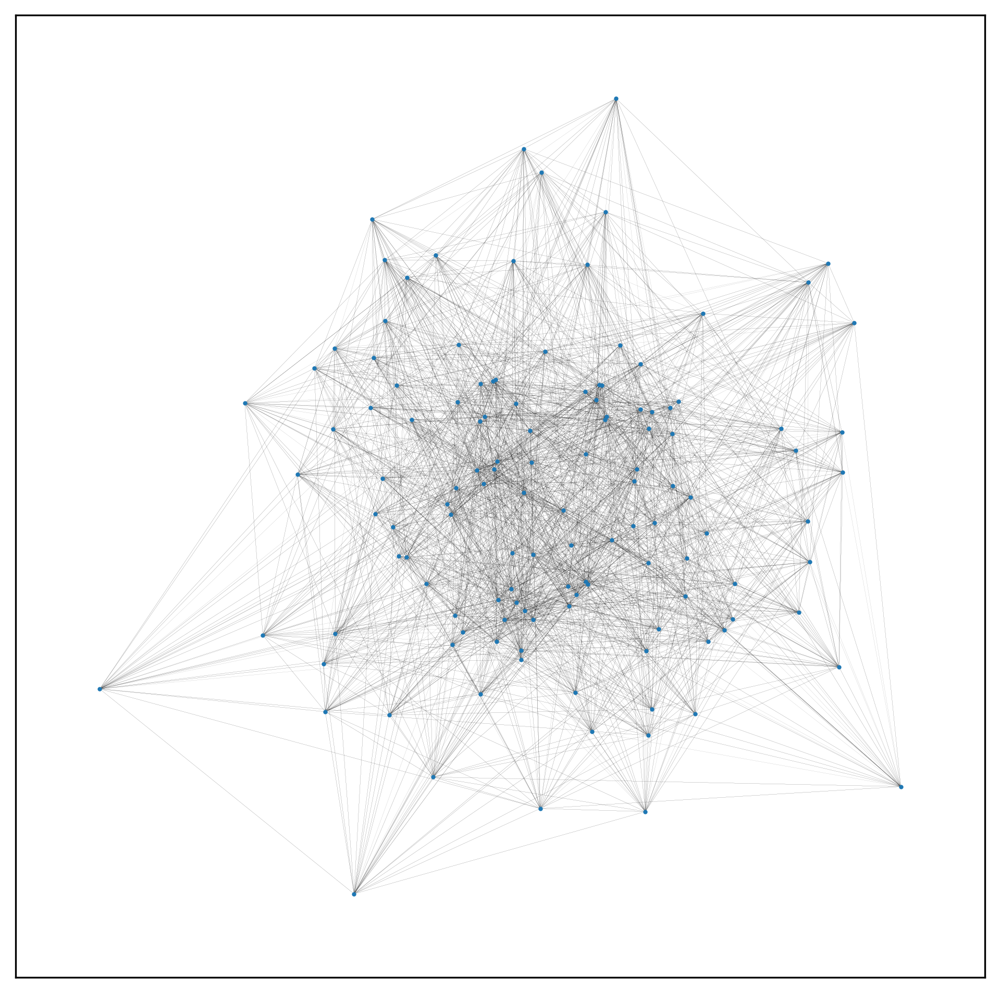

In [17]:
plt.figure(figsize=(8,8), dpi=300)
nx.draw_networkx(
    G,
    pos=nx.spectral_layout(G),
    with_labels=False,
    node_size=1,
    width=0.02,
    arrows=False,
)

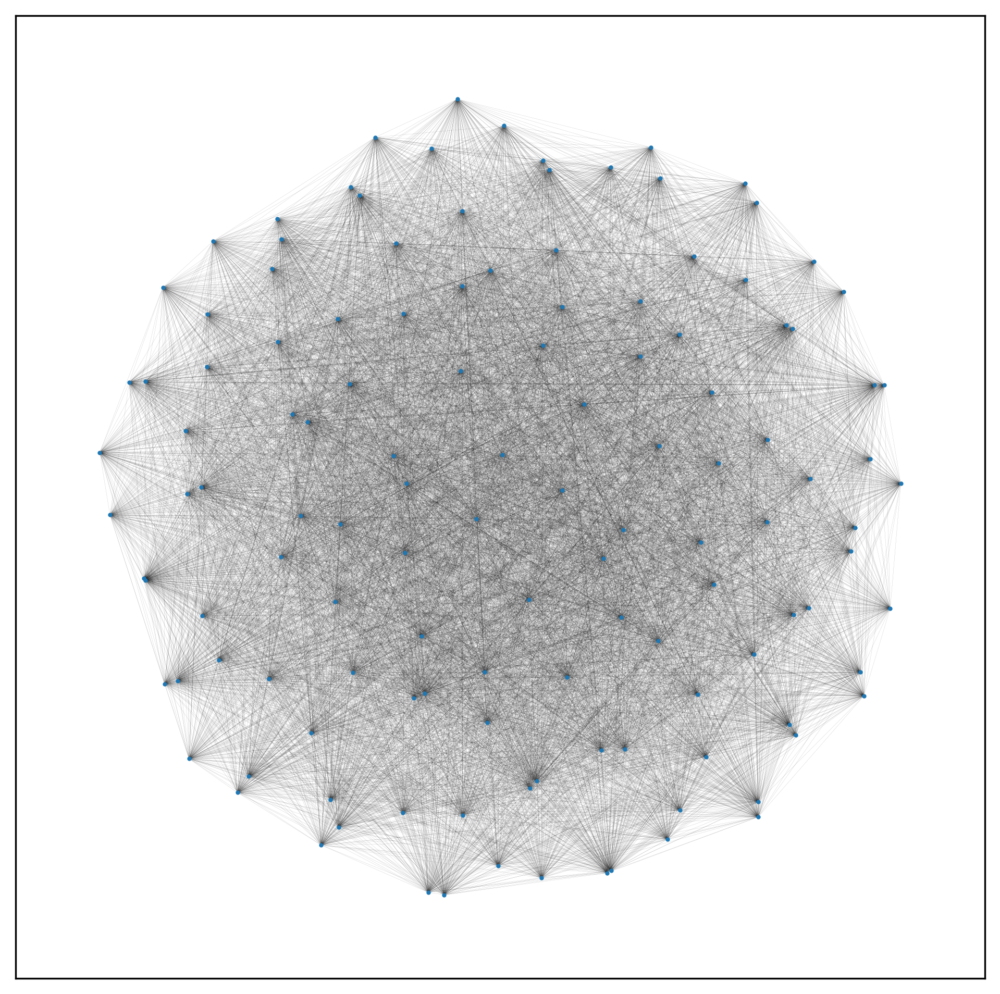

In [19]:
plt.figure(figsize=(8,8), dpi=300)
G = nx.complete_graph(127)
nx.draw_networkx(
    G,
    pos=nx.spring_layout(G),
    with_labels=False,
    node_size=1,
    width=0.02,
    arrows=False,
)